In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.basemap import Basemap

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [4]:
data = pd.read_csv('./scratch/export.csv', encoding='windows-1250', sep=';')

In [5]:
#dropna
data.dropna(how='all', subset=['Lat', 'ObsLat'], inplace=True)
data.dropna(how='all', subset=['TaxonNameCZ'], inplace=True)

C:\Anaconda3\lib\site-packages\mpl_toolkits\basemap\__init__.py:3236: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
C:\Anaconda3\lib\site-packages\mpl_toolkits\basemap\__init__.py:3245: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


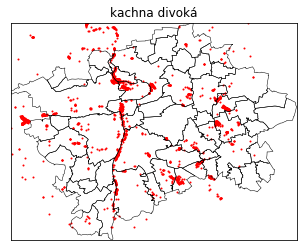

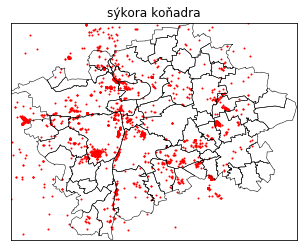

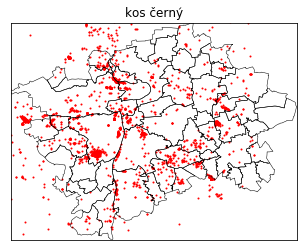

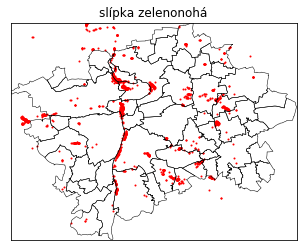

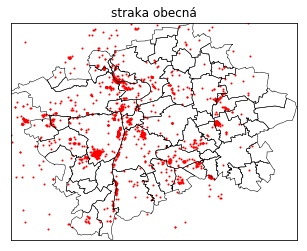

...

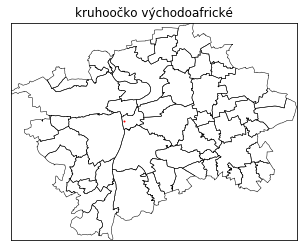

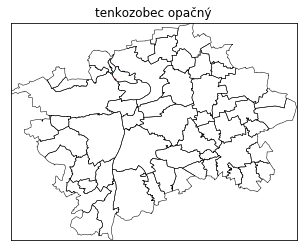

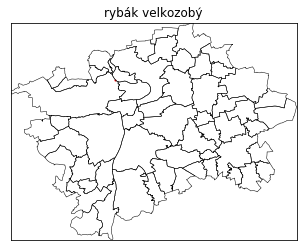

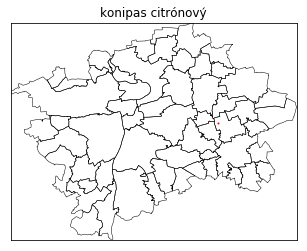

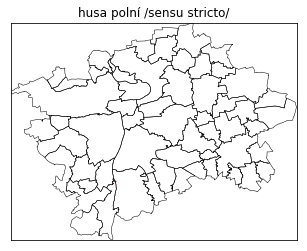

In [6]:
ordr = 0
for name in data.TaxonNameCZ.value_counts().keys():
    ordr += 1
    ser = data[data.TaxonNameCZ == name]
    plt.figure(ordr)
    map = Basemap(resolution='c', # c, l, i, h, f or None
            projection='merc',
            lat_0=50.0835494, lon_0=14.4341414,
            llcrnrlon=14.224453, llcrnrlat=49.941936, urcrnrlon=14.706795, urcrnrlat=50.177403)

    map.readshapefile('./scratch/mc/TMMESTSKECASTI_P', 'mc')
    
    x, y = map(ser.Lon.values, ser.Lat.values)

    map.scatter(x, y, 1, marker='o', color='r')
    plt.title(name)
    plt.show()